In [94]:
import numpy as np
import pyodbc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import sklearn 
from pandas.api.types import CategoricalDtype
sns.set(style="ticks", color_codes=True)

In [95]:
conn = pyodbc.connect("Driver={SQL Server Native Client 11.0};"
                      "Server=DESKTOP-79V6INH\DANIEL1;"
                      "Database=clalit;"
                      "Trusted_Connection=yes;")

In [96]:
cursor = conn.cursor()
cursor.execute('SELECT * FROM dbo.clalit3')
full_data=cursor



In [159]:
df = pd.read_sql( 'SELECT * FROM dbo.clalit3',conn)
df.head()

,storecode,skucode2,month_year,TranQuantity,Material Type,A group of materials,status,dangerous substance,Dangerous material is charged with a permit,Item Type,...,Prediction,Sourcing source,Exceptional policy,Consumer management,Seasonality,Volume marker,VENDOR,GENERY_FATHER,Plant,Safety Stock
0,3224.0,10000005719,03/2017,11.0,ZHW1,20140,1.0,None,None,0.0,...,7351.0,ארץ,0.0,ave,no,LOW,408668,None,7350.0,4671.0
1,3224.0,10000006427,02/2019,120.0,ZHW1,20190,1.0,None,None,0.0,...,25312.0,ארץ,0.0,ave,no,LOW,400095,3999005422,7350.0,31010.0
2,3315.0,10000001880,07/2017,2.0,ZHW1,20270,1.0,0,0,0.0,...,1231.0,ארץ,0.0,ave,no,HIGH,124207,None,7350.0,924.0
3,3315.0,10000007355,11/2018,5.0,ZHW3,10200,1.0,None,None,0.0,...,0.0,ארץ,0.0,ave,no,HIGH,400044,None,7350.0,0.0
4,3224.0,10000006732,02/2017,30.0,ZHW1,20180,1.0,None,None,0.0,...,45373.0,ארץ,0.0,ave,no,LOW,400077,3999010655,7350.0,53858.0


In [160]:
df.columns = [c.replace(' ', '_') for c in df.columns]

In [161]:
df.head()

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Prediction,Sourcing_source,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock
0,3224.0,10000005719,03/2017,11.0,ZHW1,20140,1.0,None,None,0.0,...,7351.0,ארץ,0.0,ave,no,LOW,408668,None,7350.0,4671.0
1,3224.0,10000006427,02/2019,120.0,ZHW1,20190,1.0,None,None,0.0,...,25312.0,ארץ,0.0,ave,no,LOW,400095,3999005422,7350.0,31010.0
2,3315.0,10000001880,07/2017,2.0,ZHW1,20270,1.0,0,0,0.0,...,1231.0,ארץ,0.0,ave,no,HIGH,124207,None,7350.0,924.0
3,3315.0,10000007355,11/2018,5.0,ZHW3,10200,1.0,None,None,0.0,...,0.0,ארץ,0.0,ave,no,HIGH,400044,None,7350.0,0.0
4,3224.0,10000006732,02/2017,30.0,ZHW1,20180,1.0,None,None,0.0,...,45373.0,ארץ,0.0,ave,no,LOW,400077,3999010655,7350.0,53858.0


In [162]:
df.shape

(109200, 59)

In [163]:
df.dtypes

storecode                                             float64
skucode2                                               object
month_year                                             object
TranQuantity                                          float64
Material_Type                                          object
A_group_of_materials                                   object
status                                                float64
dangerous_substance                                    object
Dangerous_material_is_charged_with_a_permit            object
Item_Type                                             float64
General_purpose                                       float64
Affiliation_Group                                      object
Pure_OTC                                              float64
Budget_Group                                           object
Toxic_item                                            float64
Form_of_giving                                         object
Narcotic

In [164]:
df['storecode'] = df['storecode'].astype(object)
df['TranQuantity'] = df['TranQuantity'].astype(int)
df['month_year '] = df['month_year'].astype(object)
df['Pure_OTC'] = df['Pure_OTC'].astype(object)
df['Toxic_item'] = df['Toxic_item'].astype(object)
df['chronic'] = df['chronic'].astype(object)
df['General_purpose'] = df['General_purpose'].astype(object)
#df['Quantity_in_Packaging-Absolute'] = df['Quantity_in_Packaging-Absolute'].astype(int)
#df['Quantity_in_packing-relative'] = df['Quantity_in_packing-relative'].astype(int)
df['Must_prescribe'] = df['Must_prescribe'].astype(object)
df['Date_of_basket_entry'] = df['Date_of_basket_entry'].astype(object)
df['Item_in_health_basket'] = df['Item_in_health_basket'].astype(object)
df['Send_code_to_Omri'] = df['Send_code_to_Omri'].astype(object)
df['U#S#_Patent_Expires'] = df['U#S#_Patent_Expires'].astype(object)
df['European_patent_expires'] = df['European_patent_expires'].astype(object)
df['Chemical_/_biological'] = df['Chemical_/_biological'].astype(object)
df['Narcotic_/_psychotropic'] = df['Narcotic_/_psychotropic'].astype(object)
df['General_purpose '] = df['General_purpose'].astype(object)
df['A_group_of_materials'] = df['A_group_of_materials'].astype(object)
df['status'] = df['status'].astype(object)
df['Item_Type'] = df['Item_Type'].astype(object)
df['Budget_Group'] = df['Budget_Group'].astype(object)
df['Quantity_in_absolute_packaging'] = df['Quantity_in_absolute_packaging'].astype(int)
df['Seasonality'] = df['Seasonality'].astype(object)
df['Exceptional_policy'] = df['Exceptional_policy'].astype(object)
df['Plant'] = df['Plant'].astype(object)
df['volume'] = df['volume'].astype(float)
df['Loading_group'] = df['Loading_group'].astype(object)
df['consumption_previous_year'] = df['consumption_previous_year'].astype(object)
df['PRICE'] = df['PRICE'].astype(float)
df['Price_for_absolute_packaging'] = df['Price_for_absolute_packaging'].astype(float)
df['Inventory'] = df['Inventory'].astype(int)
df['Current_consumption'] = df['Current_consumption'].astype(int)
df['Inventory_of_consumption_months'] = df['Inventory_of_consumption_months'].astype(int)
df['Prediction'] = df['Prediction'].astype(int)
df['Safety_Stock'] = df['Safety_Stock'].astype(int)
df['consumption'] = df['consumption'].astype(int)

In [165]:
df['Quantity_in_Packaging-Absolute'].fillna(0, inplace=True)
df['Quantity_in_packing-relative'].fillna(0, inplace=True)

In [166]:
df['Quantity_in_Packaging-Absolute'] = df['Quantity_in_Packaging-Absolute'].astype(int)
df['Quantity_in_packing-relative'] = df['Quantity_in_packing-relative'].astype(int)

In [167]:
df.dtypes[('Quantity_in_Packaging-Absolute')]

dtype('int32')

In [168]:
df.dtypes[('Quantity_in_packing-relative')]

dtype('int32')

In [169]:
df.dtypes

storecode                                              object
skucode2                                               object
month_year                                             object
TranQuantity                                            int32
Material_Type                                          object
A_group_of_materials                                   object
status                                                 object
dangerous_substance                                    object
Dangerous_material_is_charged_with_a_permit            object
Item_Type                                              object
General_purpose                                        object
Affiliation_Group                                      object
Pure_OTC                                               object
Budget_Group                                           object
Toxic_item                                             object
Form_of_giving                                         object
Narcotic

In [173]:
df1=df
df1=df.loc[(df['month_year'] <= '10/2019')]
df1.head()

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock,month_year,General_purpose
0,3224,10000005719,03/2017,11,ZHW1,20140,1,None,None,0,...,0,ave,no,LOW,408668,None,7350,4671,03/2017,0
1,3224,10000006427,02/2019,120,ZHW1,20190,1,None,None,0,...,0,ave,no,LOW,400095,3999005422,7350,31010,02/2019,0
2,3315,10000001880,07/2017,2,ZHW1,20270,1,0,0,0,...,0,ave,no,HIGH,124207,None,7350,924,07/2017,0
4,3224,10000006732,02/2017,30,ZHW1,20180,1,None,None,0,...,0,ave,no,LOW,400077,3999010655,7350,53858,02/2017,0
5,3315,10000004522,04/2017,3220,ZHW1,20120,1,None,None,0,...,0,ave,no,HIGH,400059,3999019172,7350,0,04/2017,0


In [174]:
df1.shape

(90697, 61)

In [176]:
df1.head()

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock,month_year,General_purpose
0,3224,10000005719,03/2017,11,ZHW1,20140,1,None,None,0,...,0,ave,no,LOW,408668,None,7350,4671,03/2017,0
1,3224,10000006427,02/2019,120,ZHW1,20190,1,None,None,0,...,0,ave,no,LOW,400095,3999005422,7350,31010,02/2019,0
2,3315,10000001880,07/2017,2,ZHW1,20270,1,0,0,0,...,0,ave,no,HIGH,124207,None,7350,924,07/2017,0
4,3224,10000006732,02/2017,30,ZHW1,20180,1,None,None,0,...,0,ave,no,LOW,400077,3999010655,7350,53858,02/2017,0
5,3315,10000004522,04/2017,3220,ZHW1,20120,1,None,None,0,...,0,ave,no,HIGH,400059,3999019172,7350,0,04/2017,0


In [177]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
for c in [c for c in df.columns if df[c].dtype in numerics]:
    df1[c] = np.log(1+df[c])

C:\Users\DANIEL\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [178]:
df1.head()

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock,month_year,General_purpose
0,3224,10000005719,03/2017,2.484907,ZHW1,20140,1,None,None,0,...,0,ave,no,LOW,408668,None,7350,8.449343,03/2017,0
1,3224,10000006427,02/2019,4.795791,ZHW1,20190,1,None,None,0,...,0,ave,no,LOW,400095,3999005422,7350,10.342097,02/2019,0
2,3315,10000001880,07/2017,1.098612,ZHW1,20270,1,0,0,0,...,0,ave,no,HIGH,124207,None,7350,6.829794,07/2017,0
4,3224,10000006732,02/2017,3.433987,ZHW1,20180,1,None,None,0,...,0,ave,no,LOW,400077,3999010655,7350,10.894125,02/2017,0
5,3315,10000004522,04/2017,8.077447,ZHW1,20120,1,None,None,0,...,0,ave,no,HIGH,400059,3999019172,7350,0.000000,04/2017,0


In [185]:
df1.describe()

,TranQuantity,Quantity_in_Packaging-Absolute,Quantity_in_packing-relative,volume,Quantity_in_absolute_packaging,PRICE,Price_for_absolute_packaging,Inventory,consumption,Inventory_of_consumption_months,Current_consumption,Prediction,Safety_Stock
count,90697.000000,90697.000000,90697.000000,90697.000000,90697.000000,90693.000000,90693.000000,90697.000000,90697.000000,90697.000000,90697.000000,90697.000000,90697.000000
mean,3.280400,2.359294,1.007643,3.888156,2.359294,1.856338,3.388498,8.347757,8.276880,0.616115,8.423441,8.140050,7.916703
std,2.042962,1.438831,1.769177,1.885215,1.438831,1.516207,1.857490,3.687011,3.381153,0.558608,3.563218,3.506519,3.492251
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.009950,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.386294,0.693147,0.000000,1.978654,0.693147,0.392042,2.151762,7.132498,6.720220,0.000000,6.877296,6.613384,6.539586
50%,3.044522,3.044522,0.000000,4.428433,3.044522,1.757858,2.855320,8.650149,8.456168,0.693147,8.674368,8.387312,8.044626
75%,4.867534,3.433987,1.791759,5.504652,3.433987,2.857619,4.281792,11.093630,10.765343,1.098612,11.047567,10.738330,10.618494
max,9.455715,6.107023,6.908755,9.207737,6.107023,9.480960,10.807915,15.681570,15.295364,6.668228,15.550081,15.274773,15.472268


In [186]:
df1.info

<bound method DataFrame.info of        storecode     skucode2 month_year  TranQuantity Material_Type  \
0           3224  10000005719    03/2017      2.484907          ZHW1   
1           3224  10000006427    02/2019      4.795791          ZHW1   
2           3315  10000001880    07/2017      1.098612          ZHW1   
4           3224  10000006732    02/2017      3.433987          ZHW1   
5           3315  10000004522    04/2017      8.077447          ZHW1   
6           3315  10000003897    03/2019      1.609438          ZHW3   
7           3315  10000003478    05/2018      2.397895          ZHW1   
8           3315  10000006295    01/2018      1.609438          ZHW1   
9           3224  10000006992    05/2018      1.098612          ZHW3   
11          3224  10000006644    06/2017      6.356108          ZHW1   
13          3315  10000003488    05/2018      1.609438          ZHW1   
14          3224  10000006445    01/2017      4.795791          ZHW1   
15          3224  10000004838   

In [187]:
print(df1.isnull().sum())

storecode                                          0
skucode2                                           0
month_year                                         0
TranQuantity                                       0
Material_Type                                      0
A_group_of_materials                               0
status                                             0
dangerous_substance                            80326
Dangerous_material_is_charged_with_a_permit    80310
Item_Type                                        405
General_purpose                                    0
Affiliation_Group                                147
Pure_OTC                                           0
Budget_Group                                       0
Toxic_item                                      7362
Form_of_giving                                 52945
Narcotic_/_psychotropic                        41313
chronic                                          428
Main_outline                                  

In [189]:
# Looking at missing values percentage for each column

(df1.isnull().sum()/df1.shape[0] * 100).sort_values(axis=0, ascending=False, inplace=False, kind='quicksort')

European_patent_expires                        98.579887
U#S#_Patent_Expires                            98.311962
For_adults                                     95.744071
Validity_of_Ministry_of_Health_registration    94.992117
type_of_packeging                              94.032879
dangerous_substance                            88.565223
Dangerous_material_is_charged_with_a_permit    88.547582
GENERY_FATHER                                  59.234594
Form_of_giving                                 58.375690
Narcotic_/_psychotropic                        45.550569
Date_of_basket_entry                           45.440312
Serving_form                                    8.714731
Chemical_/_biological                           8.402704
Toxic_item                                      8.117137
Description_outline                             7.597826
Main_outline                                    7.597826
Description_Alternative_purchasing_group        3.905311
Alternative_purchasing_group   

In [190]:
duplicate_rows=df1.duplicated()
df1[duplicate_rows]

,storecode,skucode2,month_year,TranQuantity,Material_Type,A_group_of_materials,status,dangerous_substance,Dangerous_material_is_charged_with_a_permit,Item_Type,...,Exceptional_policy,Consumer_management,Seasonality,Volume_marker,VENDOR,GENERY_FATHER,Plant,Safety_Stock,month_year,General_purpose


In [191]:
from pandas_profiling import ProfileReport
prof = ProfileReport(df1)
prof.to_file(output_file='output.html')
prof.to_notebook_iframe()

from importlib import reload
!pip install pyMechkar --upgrade

from pyMechkar.analysis import Table1
tab1 = Table1(data=df, y='TranQuantity')
tab1

In [123]:
col_names = list(df3)
col_names

['storecode',
 'skucode2',
 'month_year',
 'TranQuantity',
 'Material_Type',
 'A_group_of_materials',
 'status',
 'dangerous_substance',
 'Dangerous_material_is_charged_with_a_permit',
 'Item_Type',
 'General_purpose',
 'Affiliation_Group',
 'Pure_OTC',
 'Budget_Group',
 'Toxic_item',
 'Form_of_giving',
 'Narcotic_/_psychotropic',
 'chronic',
 'Main_outline',
 'Description_outline',
 'Validity_of_Ministry_of_Health_registration',
 'Alternative_purchasing_group',
 'Description_Alternative_purchasing_group',
 'Chemical_/_biological',
 'European_patent_expires',
 'U#S#_Patent_Expires',
 'Send_code_to_Omri',
 'Item_in_health_basket',
 'Date_of_basket_entry',
 'Must_prescribe',
 'For_adults',
 'Serving_form',
 'type_of_packeging',
 'Quantity_in_Packaging-Absolute',
 'Quantity_in_packing-relative',
 'Establishment_date_of_the_item',
 'ATC',
 'Basic_unit_of_measure',
 'ABC',
 'volume',
 'Quantity_in_absolute_packaging',
 'PRICE',
 'Price_for_absolute_packaging',
 'Loading_group',
 'Inventory'

In [124]:
col_names = ['storecode',
 'skucode2',
 'Material_Type',
 'A_group_of_materials',
 'status',
 'dangerous_substance',
 'Dangerous_material_is_charged_with_a_permit',
 'Item_Type',
 'General_purpose',
 'Affiliation_Group',
 'Pure_OTC',
 'Budget_Group',
 'Toxic_item',
 'Form_of_giving',
 'Narcotic_/_psychotropic',
 'chronic',
 'Main_outline',
 'Description_outline',
 'Validity_of_Ministry_of_Health_registration',
 'Alternative_purchasing_group',
 'Description_Alternative_purchasing_group',
 'Chemical_/_biological',
 'Send_code_to_Omri',
 'Item_in_health_basket',
 'Must_prescribe',
 'For_adults',
 'Serving_form',
 'type_of_packeging',
 'ATC',
 'Basic_unit_of_measure',
 'ABC',
 'Loading_group',
 'Sourcing_source',
 'Exceptional_policy',
 'Consumer_management',
 'Seasonality',
 'VENDOR',
 'GENERY_FATHER',
 'Plant',]
col_names

['storecode',
 'skucode2',
 'Material_Type',
 'A_group_of_materials',
 'status',
 'dangerous_substance',
 'Dangerous_material_is_charged_with_a_permit',
 'Item_Type',
 'General_purpose',
 'Affiliation_Group',
 'Pure_OTC',
 'Budget_Group',
 'Toxic_item',
 'Form_of_giving',
 'Narcotic_/_psychotropic',
 'chronic',
 'Main_outline',
 'Description_outline',
 'Validity_of_Ministry_of_Health_registration',
 'Alternative_purchasing_group',
 'Description_Alternative_purchasing_group',
 'Chemical_/_biological',
 'Send_code_to_Omri',
 'Item_in_health_basket',
 'Must_prescribe',
 'For_adults',
 'Serving_form',
 'type_of_packeging',
 'ATC',
 'Basic_unit_of_measure',
 'ABC',
 'Loading_group',
 'Sourcing_source',
 'Exceptional_policy',
 'Consumer_management',
 'Seasonality',
 'VENDOR',
 'GENERY_FATHER',
 'Plant']

In [125]:
for col in col_names:
    df3[col] = df3[col].astype('category',copy=False)


In [84]:
col_names1 = ['month_year','U#S#_Patent_Expires','Date_of_basket_entry']
print("\nNames of dataframe columns")
col_names1


Names of dataframe columns


['month_year', 'U#S#_Patent_Expires', 'Date_of_basket_entry']

In [126]:
for col in col_names1:
    df3[col] = df3[col].astype('datetime64',copy=False)

In [127]:
df3.dtypes

storecode                                            category
skucode2                                             category
month_year                                     datetime64[ns]
TranQuantity                                          float64
Material_Type                                        category
A_group_of_materials                                 category
status                                               category
dangerous_substance                                  category
Dangerous_material_is_charged_with_a_permit          category
Item_Type                                            category
General_purpose                                      category
Affiliation_Group                                    category
Pure_OTC                                             category
Budget_Group                                         category
Toxic_item                                           category
Form_of_giving                                       category
Narcotic

!pip install pandas

In [ ]:
##Numeric vs Numeric: scatter plot

In [129]:
df3 = df3.select_dtypes([np.float])
df3.head()

,TranQuantity,Quantity_in_Packaging-Absolute,Quantity_in_packing-relative,volume,Quantity_in_absolute_packaging,PRICE,Price_for_absolute_packaging,Inventory,consumption,Inventory_of_consumption_months,Current_consumption,consumption_previous_year,Prediction,Safety_Stock
0,11.0,21.0,0.0,101.000,21.0,9.36,196.56,8811.0,6369.0,1.38,8491.0,83062.0,7351.0,4671.0
1,120.0,30.0,0.0,3.733,30.0,0.21,6.30,68550.0,26450.0,2.59,34920.0,306420.0,25312.0,31010.0
2,2.0,1.0,500.0,941.000,1.0,14.04,14.04,875.0,1321.0,0.66,2220.0,13544.0,1231.0,924.0
4,30.0,10.0,0.0,10.500,10.0,0.56,5.60,87390.0,47073.0,1.86,59330.0,525410.0,45373.0,53858.0
5,3220.0,20.0,0.0,6.300,20.0,0.14,2.80,0.0,0.0,0.00,0.0,0.0,0.0,0.0


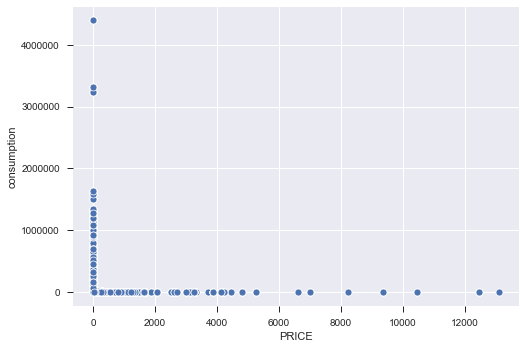

In [67]:
sns.scatterplot(x='PRICE',y='consumption',data=df) 

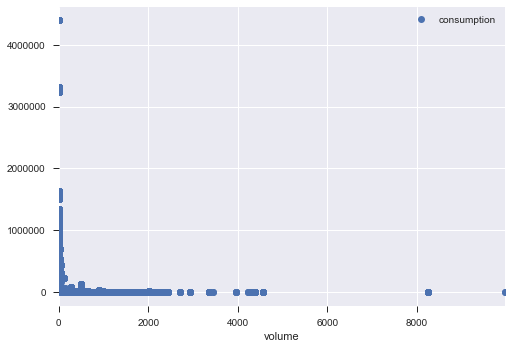

In [63]:
df.plot(x='volume', y='consumption', style='o')

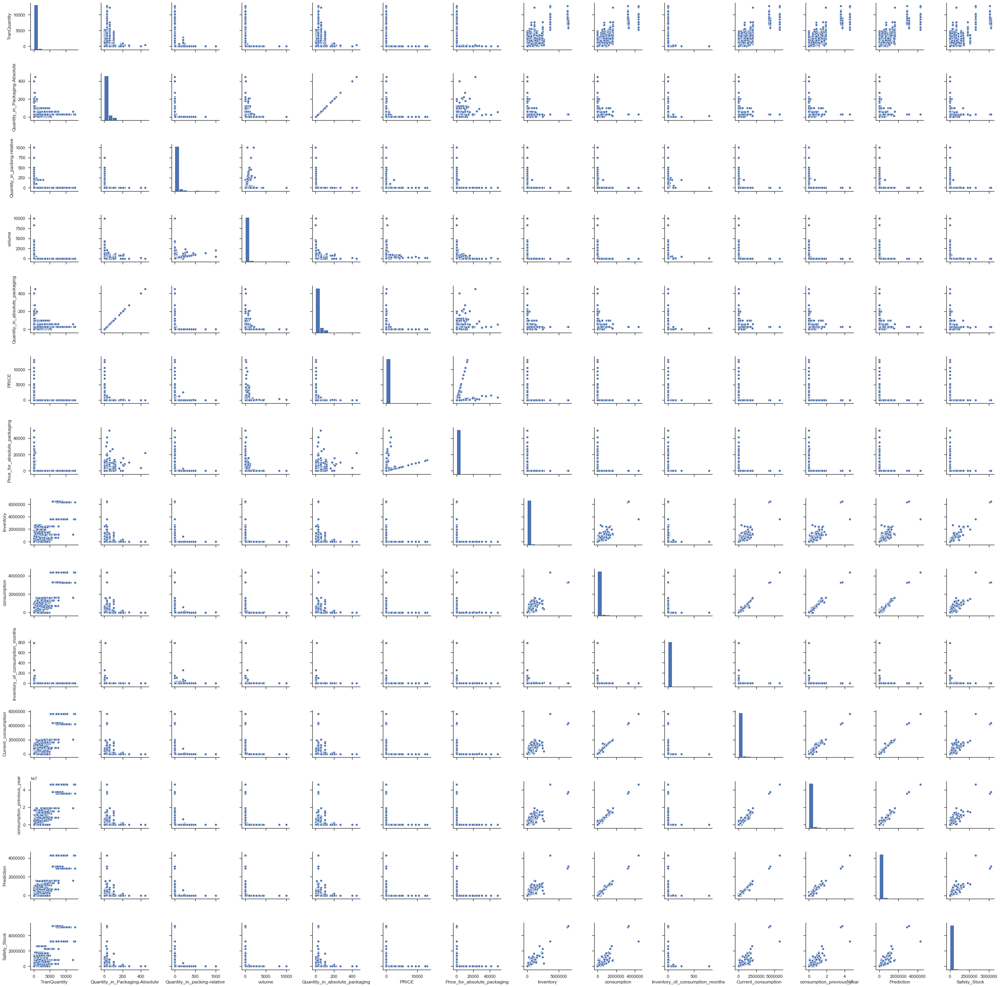

In [130]:
sns.pairplot(df3, height=2.5);

In [54]:
df2=df

In [59]:
df2['TranQuantity'] = df2['TranQuantity'].astype(int)

In [60]:
df2 = pd.DataFrame(df2,columns=['TranQuantity'])
df2 = df2.replace(0, np.nan)
df2 = df2.dropna(how='all', axis=0)
df2 = df2.replace(np.nan, 0)
print(df2)

        TranQuantity
0                 11
1                120
2                  2
3                  5
4                 30
5               3220
6                  4
7                 10
8                  4
9                  2
10                 3
11               575
12                11
13                 4
14               120
15                24
16               240
17                 2
18                 1
19               110
20                 4
21                60
22                 1
23               483
24              1440
25               310
26                 1
27                 5
28                 7
29                62
...              ...
109169           140
109170             8
109171             3
109172             7
109173            10
109174             3
109175             4
109176             4
109177           240
109178             2
109179             1
109180           540
109181            40
109182             2
109183           112
109184       

In [61]:
df2['log_value'] = np.log(df2['TranQuantity']) 
print(df2)

        TranQuantity  log_value
0                 11   2.397895
1                120   4.787492
2                  2   0.693147
3                  5   1.609438
4                 30   3.401197
5               3220   8.077137
6                  4   1.386294
7                 10   2.302585
8                  4   1.386294
9                  2   0.693147
10                 3   1.098612
11               575   6.354370
12                11   2.397895
13                 4   1.386294
14               120   4.787492
15                24   3.178054
16               240   5.480639
17                 2   0.693147
18                 1   0.000000
19               110   4.700480
20                 4   1.386294
21                60   4.094345
22                 1   0.000000
23               483   6.180017
24              1440   7.272398
25               310   5.736572
26                 1   0.000000
27                 5   1.609438
28                 7   1.945910
29                62   4.127134
...     

count    108654.000000
mean          3.118956
std           2.216422
min           0.000000
25%           1.098612
50%           2.995732
75%           4.867534
max           9.455637
Name: log_value, dtype: float64


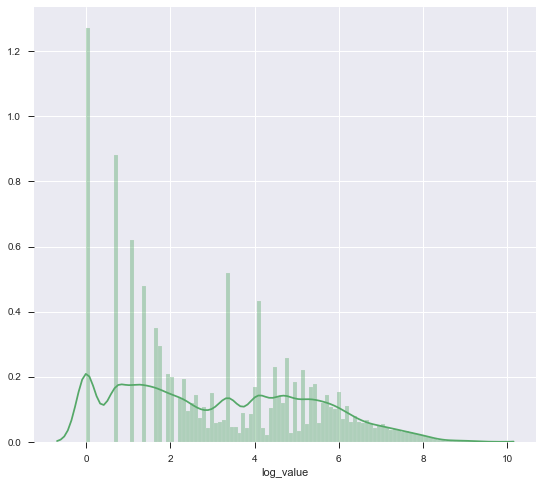

In [62]:
print(df2['log_value'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(df2['log_value'], color='g', bins=100, hist_kws={'alpha': 0.4});

In [45]:
df3=df

In [48]:
df3['consumption'] = df3['consumption'].astype(int)

In [50]:
df3 = pd.DataFrame(df3,columns=['consumption'])
df3 = df3.replace(0, np.nan)
df3 = df3.dropna(how='all', axis=0)
df3 = df3.replace(np.nan, 0)
print(df3)

        consumption
0              6369
1             26450
2              1321
4             47073
7              1429
8              3480
9               514
10             1482
11           182942
12             4000
13              967
14            68340
16           260760
17              947
18             3456
19            78320
20             1510
22            12389
23           537399
24            96340
25           206747
26               52
27             1013
28             1294
29            12747
30              700
31             4493
32              959
33              348
34             5339
...             ...
109167         8446
109168       129620
109169        18452
109170         4742
109171          121
109172         2241
109173        10920
109175          471
109176         2880
109177        93250
109178         2299
109179          810
109180       107100
109181        69973
109183        21608
109184        33970
109185        27233
109186          820


In [203]:
df3['consumption_log'] = np.log(df3['consumption']) 
print(df3)

        storecode     skucode2 month_year  TranQuantity Material_Type  \
0          3224.0  10000005719    03/2017          11.0          ZHW1   
1          3224.0  10000006427    02/2019         120.0          ZHW1   
2          3315.0  10000001880    07/2017           2.0          ZHW1   
4          3224.0  10000006732    02/2017          30.0          ZHW1   
5          3315.0  10000004522    04/2017        3220.0          ZHW1   
6          3315.0  10000003897    03/2019           4.0          ZHW3   
7          3315.0  10000003478    05/2018          10.0          ZHW1   
8          3315.0  10000006295    01/2018           4.0          ZHW1   
9          3224.0  10000006992    05/2018           2.0          ZHW3   
11         3224.0  10000006644    06/2017         575.0          ZHW1   
13         3315.0  10000003488    05/2018           4.0          ZHW1   
14         3224.0  10000006445    01/2017         120.0          ZHW1   
15         3224.0  10000004838    01/2019          

In [217]:
print(df3['log_value'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(df3['log_value'], color='g', bins=100, hist_kws={'alpha': 0.4});

KeyError: 'log_value'

In [78]:
list(set(df.dtypes.tolist()))

[CategoricalDtype(categories=['BLS', 'BT', 'EA', 'KG', 'KIT', 'PAC'], ordered=False),
 CategoricalDtype(categories=[0.0, 1.0, 2.0, 3.0, 5.0], ordered=False),
 dtype('int32'),
 CategoricalDtype(categories=['100407', '114040', '117298', '117446', '117469', '117519',
                   '118034', '119235', '120640', '120946',
                   ...
                   '700051', '700068', '700094', '700118', '700124', '700149',
                   '702062', '702266', '702276', '702431'],
                  ordered=False),
 CategoricalDtype(categories=['A', 'B', 'D', 'E', 'H'], ordered=False),
 CategoricalDtype(categories=[0.0, 1.0, 2.0, 3.0], ordered=False),
 CategoricalDtype(categories=[0.0, 1.0, 3.0, 6.0], ordered=False),
 CategoricalDtype(categories=[1.0], ordered=False),
 CategoricalDtype(categories=['0', '1', '10', '102', '103', '104', '105', '106', '107',
                   '108',
                   ...
                   '86', '87', '88', '89', '9', '91', '92', '93', '94', '96'],
      

In [96]:
df['volume'] = df['volume'].astype(int)
df['PRICE'] = df['PRICE'].astype(float)
df['Inventory'] = df['Inventory'].astype(int)
df['Prediction'] = df['Prediction'].astype(int)
df['Safety_Stock'] = df['Safety_Stock'].astype(int)

In [240]:
df_num = df.select_dtypes(include = ['int'])
df_num.head()

,storecode,TranQuantity,A_group_of_materials,status,volume,Quantity_in_absolute_packaging,Exceptional_policy,Plant
0,3224,11,20140,1,101,21,0,7350
1,3224,120,20190,1,3,30,0,7350
2,3315,2,20270,1,941,1,0,7350
3,3315,5,10200,1,198,1,0,7350
4,3224,30,20180,1,10,10,0,7350


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001C6B1C56048>,
      dtype=object)

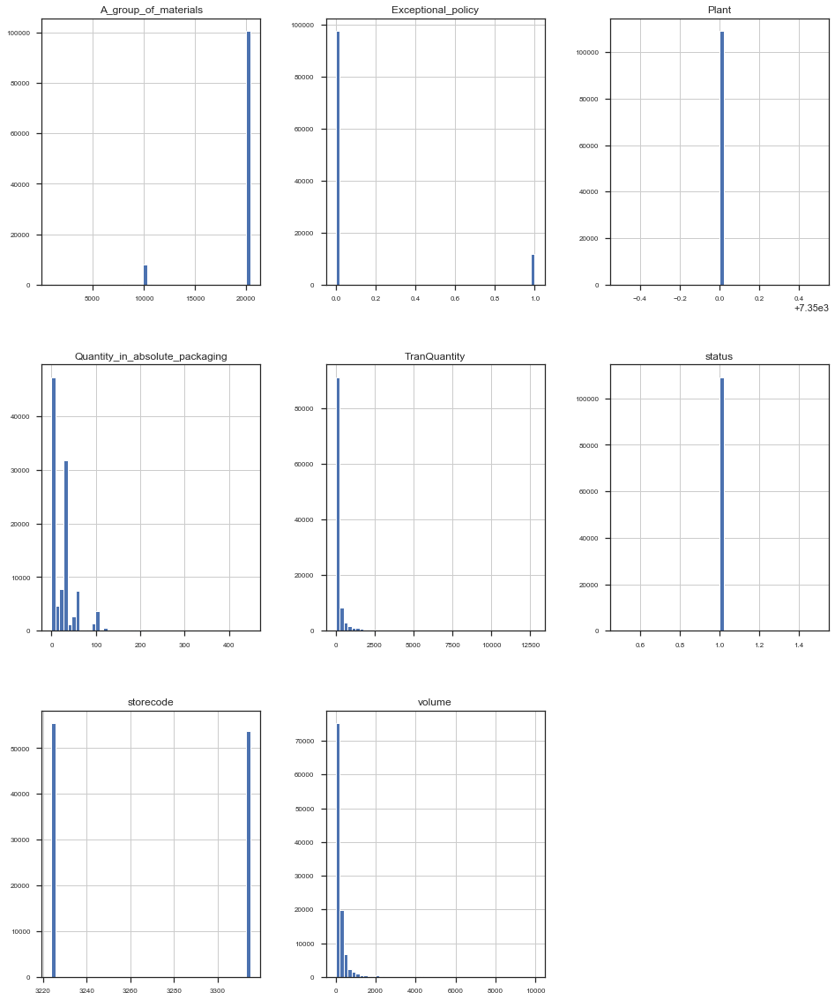

In [241]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)

In [99]:
df_num_corr = df_num.corr()['consumption'][:-1]  #-1 because the latest row is TranQuantity
golden_features_list = df_num_corr[abs(df_num_corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with consumption:\n{}".format(len(golden_features_list), golden_features_list))

There is 4 strongly correlated values with consumption:
consumption     1.000000
Prediction      0.992372
TranQuantity    0.871339
Inventory       0.869212
Name: consumption, dtype: float64


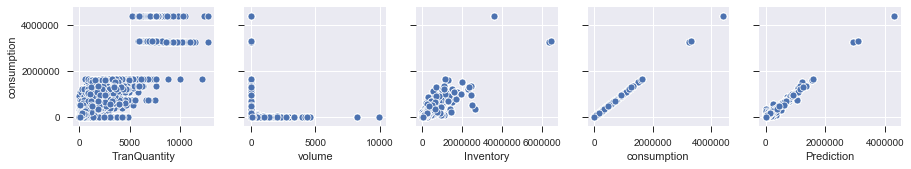

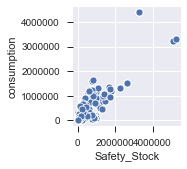

In [100]:
for i in range(0, len(df_num.columns), 5):
    sns.pairplot(data=df_num,
                x_vars=df_num.columns[i:i+5],
                y_vars=['consumption'])

In [ ]:
#Outlier detection

In [203]:
df.head()

,storecode,skucode2,month_year,TranQuantity,Material Type,A group of materials,status,dangerous substance,Dangerous material is charged with a permit,Item Type,...,Prediction,Sourcing source,Exceptional policy,Consumer management,Seasonality,Volume marker,VENDOR,GENERY_FATHER,Plant,Safety Stock
0,3224.0,10000005719,03/2017,11.0,ZHW1,20140,1.0,None,None,0.0,...,7351.0,ארץ,0.0,ave,no,LOW,408668,None,7350.0,4671.0
1,3224.0,10000006427,02/2019,120.0,ZHW1,20190,1.0,None,None,0.0,...,25312.0,ארץ,0.0,ave,no,LOW,400095,3999005422,7350.0,31010.0
2,3315.0,10000001880,07/2017,2.0,ZHW1,20270,1.0,0,0,0.0,...,1231.0,ארץ,0.0,ave,no,HIGH,124207,None,7350.0,924.0
3,3315.0,10000007355,11/2018,5.0,ZHW3,10200,1.0,None,None,0.0,...,0.0,ארץ,0.0,ave,no,HIGH,400044,None,7350.0,0.0
4,3224.0,10000006732,02/2017,30.0,ZHW1,20180,1.0,None,None,0.0,...,45373.0,ארץ,0.0,ave,no,LOW,400077,3999010655,7350.0,53858.0


In [205]:
dfout=df
dfout.head()

,storecode,skucode2,month_year,TranQuantity,Material Type,A group of materials,status,dangerous substance,Dangerous material is charged with a permit,Item Type,...,Prediction,Sourcing source,Exceptional policy,Consumer management,Seasonality,Volume marker,VENDOR,GENERY_FATHER,Plant,Safety Stock
0,3224.0,10000005719,03/2017,11.0,ZHW1,20140,1.0,None,None,0.0,...,7351.0,ארץ,0.0,ave,no,LOW,408668,None,7350.0,4671.0
1,3224.0,10000006427,02/2019,120.0,ZHW1,20190,1.0,None,None,0.0,...,25312.0,ארץ,0.0,ave,no,LOW,400095,3999005422,7350.0,31010.0
2,3315.0,10000001880,07/2017,2.0,ZHW1,20270,1.0,0,0,0.0,...,1231.0,ארץ,0.0,ave,no,HIGH,124207,None,7350.0,924.0
3,3315.0,10000007355,11/2018,5.0,ZHW3,10200,1.0,None,None,0.0,...,0.0,ארץ,0.0,ave,no,HIGH,400044,None,7350.0,0.0
4,3224.0,10000006732,02/2017,30.0,ZHW1,20180,1.0,None,None,0.0,...,45373.0,ארץ,0.0,ave,no,LOW,400077,3999010655,7350.0,53858.0


In [198]:
dfout = dfout.select_dtypes(include = ['int','float'])
df_num.head()

,TranQuantity,volume,Inventory,consumption,Prediction,Safety_Stock
0,11,101,8811,6369,7351,4671
1,120,3,68550,26450,25312,31010
2,2,941,875,1321,1231,924
3,5,198,0,0,0,0
4,30,10,87390,47073,45373,53858


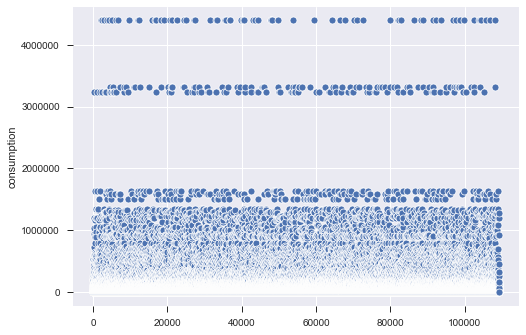

In [181]:
###  using scatterplots
sns.scatterplot(x=dfout.index,y=dfout['consumption'])

In [ ]:
import seaborn as sns
sns.set(style="ticks")
sns.pairplot(df, hue="Seasonality")